# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0K/60.0K [00:10<00:00, 5.91KFile/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

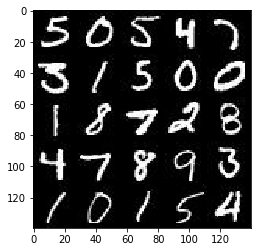

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

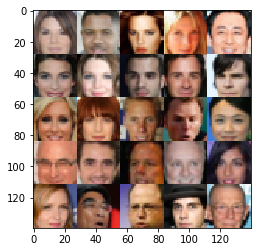

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs_real = tf.placeholder(tf.float32,
                                 (None, image_width, image_height, image_channels),
                                 name='input_real')
    inputs_z = tf.placeholder(tf.float32,
                              (None, z_dim),
                              name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')

    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [31]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        
        alpha = 0.2
        
        # Input layer is 28x28x3
        
        # Convolution layer 1
        dis1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        dis1 = tf.maximum(alpha * dis1, dis1)
        # 14x14x64
        
        # Convolution layer 2
        dis2 = tf.layers.conv2d(dis1, 128, 5, strides=2, padding='same')
        dis2 = tf.layers.batch_normalization(dis2, training=True)
        dis2 = tf.maximum(alpha * dis2, dis2)
        # 7x7x128
        
        # Convolution layer 3
        dis3 = tf.layers.conv2d(dis2, 256, 5, strides=2, padding='same')
        dis3 = tf.layers.batch_normalization(dis3, training=True)
        dis3 = tf.maximum(alpha * dis3, dis3)
        # 4x4x256
        
        # Flatten layer
        flat = tf.reshape(dis3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [32]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=not is_train):
        
        alpha = 0.2
        # Fully connected layer
        gen1 = tf.layers.dense(z, 4*4*512)
        
        gen1 = tf.reshape(gen1, (-1, 4, 4, 512))
        gen1 = tf.layers.batch_normalization(gen1, training=is_train)
        gen1 = tf.maximum(alpha * gen1, gen1)
        # 4x4x512
        
        # Convolutional layer 1
        gen2 = tf.layers.conv2d_transpose(gen1, 256, 4, strides=1, padding='valid')
        gen2 = tf.layers.batch_normalization(gen2, training=is_train)
        gen2 = tf.maximum(alpha * gen2, gen2)
        # 7x7x256
        
        # Convolutional layer 2
        gen3 = tf.layers.conv2d_transpose(gen2, 128, 5, strides=2, padding='same')
        gen3 = tf.layers.batch_normalization(gen3, training=is_train)
        gen3 = tf.maximum(alpha * gen3, gen3)
        # 14x14x128
        
        # Output layer
        logits = tf.layers.conv2d_transpose(gen3, out_channel_dim, 5, strides=2, padding='same')
        # 28x28xoutput_dim
        
        out = tf.tanh(logits)
        
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [20]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_real,
            labels=tf.ones_like(d_model_real) * 0.9))
    
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_fake,
            labels=tf.zeros_like(d_model_fake)))
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_fake,
            labels=tf.ones_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [21]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [22]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()


### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [34]:
def train(epoch_count, batch_size, z_dim, learning_rate_, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model

    inputs_real, inputs_z, learning_rate = model_inputs(data_shape[1],
                                                        data_shape[2],
                                                        data_shape[3],
                                                        z_dim)
    
    
    d_loss, g_loss = model_loss(inputs_real, inputs_z, out_channel_dim=data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)

    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                
                # image 0.5 ~ -0.5 -> -1 ~ 1
                batch_images = batch_images * 2
                
                # Sample random noise
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run Optimizer
                _ = sess.run(d_train_opt, feed_dict={inputs_real: batch_images,
                                                     inputs_z: batch_z,
                                                     learning_rate: learning_rate_})
                _ = sess.run(g_train_opt, feed_dict={inputs_real: batch_images,
                                                     inputs_z: batch_z,
                                                     learning_rate: learning_rate_})
                
                if steps % 20 == 0:
                    train_loss_d = d_loss.eval({inputs_z: batch_z,
                                                inputs_real: batch_images})
                    train_loss_g = g_loss.eval({inputs_z: batch_z})
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Generator Loss: {:.4f}".format(train_loss_g),
                          "Discriminator Loss: {:.4f}".format(train_loss_d))
                    
                if steps % 100 == 0:
                    n_images = 100
                    show_generator_output(sess, n_images, inputs_z, data_shape[3], data_image_mode)


### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/5... Generator Loss: 2.7163 Discriminator Loss: 0.4466
Epoch 1/5... Generator Loss: 10.0827 Discriminator Loss: 2.7710
Epoch 1/5... Generator Loss: 3.2683 Discriminator Loss: 0.5144
Epoch 1/5... Generator Loss: 3.5633 Discriminator Loss: 0.4191
Epoch 1/5... Generator Loss: 3.3112 Discriminator Loss: 0.4385


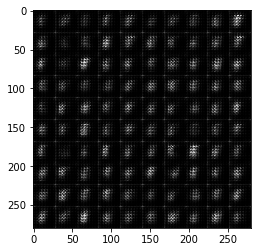

Epoch 1/5... Generator Loss: 2.9661 Discriminator Loss: 0.4929
Epoch 1/5... Generator Loss: 3.0547 Discriminator Loss: 0.4542
Epoch 1/5... Generator Loss: 1.7627 Discriminator Loss: 0.6462
Epoch 1/5... Generator Loss: 2.1006 Discriminator Loss: 0.6351
Epoch 1/5... Generator Loss: 3.0121 Discriminator Loss: 0.4707


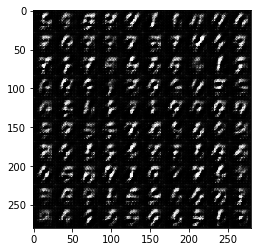

Epoch 1/5... Generator Loss: 0.6858 Discriminator Loss: 1.3409
Epoch 1/5... Generator Loss: 2.4646 Discriminator Loss: 0.5641
Epoch 1/5... Generator Loss: 2.0570 Discriminator Loss: 0.6178
Epoch 1/5... Generator Loss: 2.0569 Discriminator Loss: 0.6672
Epoch 1/5... Generator Loss: 1.6548 Discriminator Loss: 0.8280


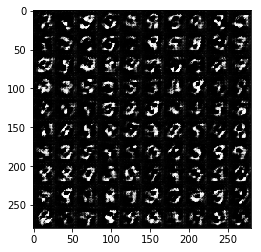

Epoch 1/5... Generator Loss: 0.9502 Discriminator Loss: 1.0637
Epoch 1/5... Generator Loss: 3.0019 Discriminator Loss: 1.2311
Epoch 1/5... Generator Loss: 2.1681 Discriminator Loss: 0.9259
Epoch 1/5... Generator Loss: 1.8411 Discriminator Loss: 1.0841
Epoch 1/5... Generator Loss: 1.1391 Discriminator Loss: 1.0141


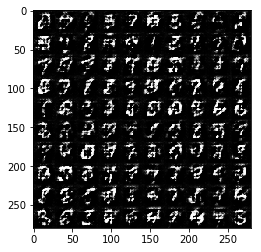

Epoch 1/5... Generator Loss: 1.9803 Discriminator Loss: 0.8977
Epoch 1/5... Generator Loss: 0.8867 Discriminator Loss: 1.0466
Epoch 1/5... Generator Loss: 0.6959 Discriminator Loss: 1.1744
Epoch 2/5... Generator Loss: 2.1897 Discriminator Loss: 1.0721
Epoch 2/5... Generator Loss: 1.4440 Discriminator Loss: 0.9760


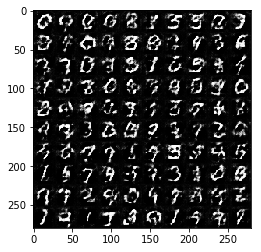

Epoch 2/5... Generator Loss: 1.7225 Discriminator Loss: 0.9080
Epoch 2/5... Generator Loss: 1.4549 Discriminator Loss: 0.8203
Epoch 2/5... Generator Loss: 1.3694 Discriminator Loss: 0.8585
Epoch 2/5... Generator Loss: 0.7907 Discriminator Loss: 1.0832
Epoch 2/5... Generator Loss: 0.8838 Discriminator Loss: 1.0102


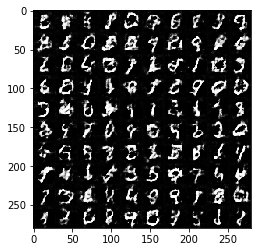

Epoch 2/5... Generator Loss: 1.9465 Discriminator Loss: 1.0945
Epoch 2/5... Generator Loss: 1.8834 Discriminator Loss: 0.9873
Epoch 2/5... Generator Loss: 1.4835 Discriminator Loss: 0.8798
Epoch 2/5... Generator Loss: 0.7311 Discriminator Loss: 1.1178
Epoch 2/5... Generator Loss: 1.3212 Discriminator Loss: 0.8850


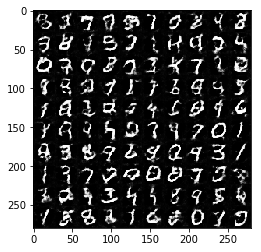

Epoch 2/5... Generator Loss: 0.7293 Discriminator Loss: 1.1573
Epoch 2/5... Generator Loss: 0.6413 Discriminator Loss: 1.1906
Epoch 2/5... Generator Loss: 0.6459 Discriminator Loss: 1.2372
Epoch 2/5... Generator Loss: 1.5945 Discriminator Loss: 1.0081
Epoch 2/5... Generator Loss: 2.4678 Discriminator Loss: 1.2411


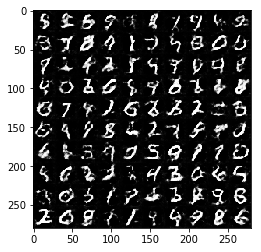

Epoch 2/5... Generator Loss: 2.0314 Discriminator Loss: 0.9860
Epoch 2/5... Generator Loss: 1.4649 Discriminator Loss: 0.8705
Epoch 2/5... Generator Loss: 1.6911 Discriminator Loss: 0.9340
Epoch 2/5... Generator Loss: 1.4646 Discriminator Loss: 0.8511
Epoch 2/5... Generator Loss: 1.5997 Discriminator Loss: 0.8480


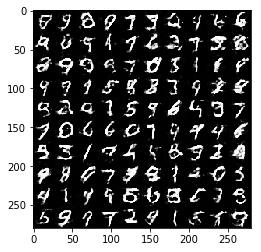

Epoch 2/5... Generator Loss: 1.0154 Discriminator Loss: 0.9129
Epoch 3/5... Generator Loss: 0.4619 Discriminator Loss: 1.4394
Epoch 3/5... Generator Loss: 1.7350 Discriminator Loss: 0.7838
Epoch 3/5... Generator Loss: 1.2979 Discriminator Loss: 0.8524
Epoch 3/5... Generator Loss: 2.6829 Discriminator Loss: 1.2241


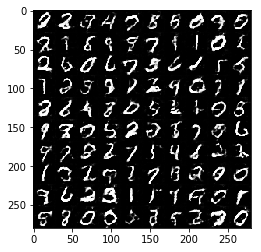

Epoch 3/5... Generator Loss: 1.0606 Discriminator Loss: 0.9620
Epoch 3/5... Generator Loss: 1.6330 Discriminator Loss: 0.7756
Epoch 3/5... Generator Loss: 1.9960 Discriminator Loss: 0.8540
Epoch 3/5... Generator Loss: 1.8683 Discriminator Loss: 0.8685
Epoch 3/5... Generator Loss: 1.4088 Discriminator Loss: 0.7835


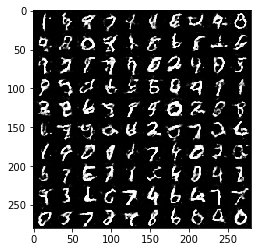

Epoch 3/5... Generator Loss: 1.4791 Discriminator Loss: 0.7854
Epoch 3/5... Generator Loss: 1.5582 Discriminator Loss: 0.8050
Epoch 3/5... Generator Loss: 1.6261 Discriminator Loss: 0.9121
Epoch 3/5... Generator Loss: 1.2053 Discriminator Loss: 0.8383
Epoch 3/5... Generator Loss: 1.7485 Discriminator Loss: 0.6633


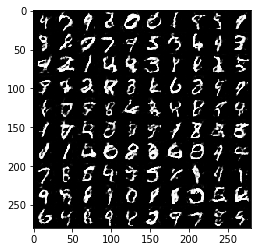

Epoch 3/5... Generator Loss: 0.4564 Discriminator Loss: 1.5713
Epoch 3/5... Generator Loss: 1.2439 Discriminator Loss: 0.8059
Epoch 3/5... Generator Loss: 1.4147 Discriminator Loss: 0.7805
Epoch 3/5... Generator Loss: 1.3292 Discriminator Loss: 0.7726
Epoch 3/5... Generator Loss: 1.6444 Discriminator Loss: 0.8018


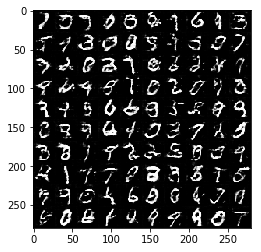

Epoch 3/5... Generator Loss: 1.3090 Discriminator Loss: 0.8447
Epoch 3/5... Generator Loss: 0.9731 Discriminator Loss: 0.9157
Epoch 3/5... Generator Loss: 1.1034 Discriminator Loss: 0.8326
Epoch 3/5... Generator Loss: 1.3544 Discriminator Loss: 0.7720
Epoch 3/5... Generator Loss: 1.3886 Discriminator Loss: 0.7623


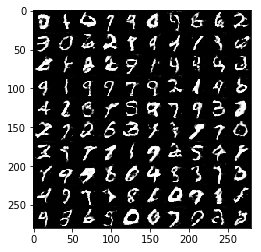

Epoch 4/5... Generator Loss: 1.5828 Discriminator Loss: 0.6858
Epoch 4/5... Generator Loss: 2.9745 Discriminator Loss: 1.4418
Epoch 4/5... Generator Loss: 1.0720 Discriminator Loss: 0.8846
Epoch 4/5... Generator Loss: 1.1813 Discriminator Loss: 0.7889
Epoch 4/5... Generator Loss: 0.8573 Discriminator Loss: 0.9995


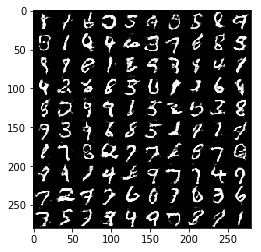

Epoch 4/5... Generator Loss: 1.1815 Discriminator Loss: 0.8159
Epoch 4/5... Generator Loss: 0.9198 Discriminator Loss: 0.9738
Epoch 4/5... Generator Loss: 0.9766 Discriminator Loss: 1.0852
Epoch 4/5... Generator Loss: 1.2042 Discriminator Loss: 0.8061
Epoch 4/5... Generator Loss: 1.4662 Discriminator Loss: 0.8453


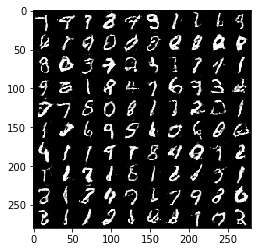

Epoch 4/5... Generator Loss: 1.0491 Discriminator Loss: 0.9377
Epoch 4/5... Generator Loss: 1.3957 Discriminator Loss: 0.7658
Epoch 4/5... Generator Loss: 1.0645 Discriminator Loss: 0.8966
Epoch 4/5... Generator Loss: 0.7648 Discriminator Loss: 1.0526
Epoch 4/5... Generator Loss: 1.5795 Discriminator Loss: 0.8727


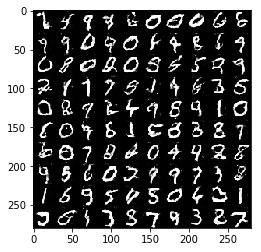

Epoch 4/5... Generator Loss: 1.0956 Discriminator Loss: 0.8469
Epoch 4/5... Generator Loss: 0.2885 Discriminator Loss: 2.0602
Epoch 4/5... Generator Loss: 0.7886 Discriminator Loss: 1.0595
Epoch 4/5... Generator Loss: 1.2382 Discriminator Loss: 0.8174
Epoch 4/5... Generator Loss: 0.8022 Discriminator Loss: 1.0366


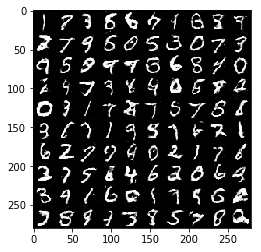

Epoch 4/5... Generator Loss: 1.2252 Discriminator Loss: 0.7886
Epoch 4/5... Generator Loss: 0.6031 Discriminator Loss: 1.2852
Epoch 4/5... Generator Loss: 1.6909 Discriminator Loss: 0.6875
Epoch 5/5... Generator Loss: 0.7881 Discriminator Loss: 1.0968
Epoch 5/5... Generator Loss: 1.1873 Discriminator Loss: 0.8339


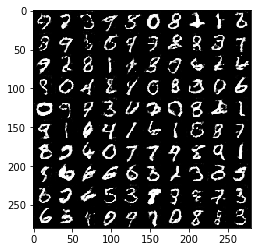

Epoch 5/5... Generator Loss: 1.2484 Discriminator Loss: 0.8466
Epoch 5/5... Generator Loss: 1.7877 Discriminator Loss: 0.7540
Epoch 5/5... Generator Loss: 2.1367 Discriminator Loss: 1.0372
Epoch 5/5... Generator Loss: 1.1920 Discriminator Loss: 0.8147
Epoch 5/5... Generator Loss: 1.2994 Discriminator Loss: 0.7440


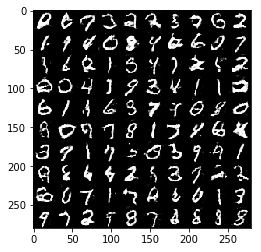

Epoch 5/5... Generator Loss: 1.6404 Discriminator Loss: 0.7637
Epoch 5/5... Generator Loss: 1.3171 Discriminator Loss: 0.7782
Epoch 5/5... Generator Loss: 1.6276 Discriminator Loss: 0.6445
Epoch 5/5... Generator Loss: 0.7148 Discriminator Loss: 1.1444
Epoch 5/5... Generator Loss: 1.3376 Discriminator Loss: 0.7863


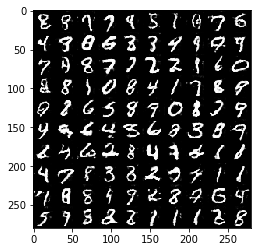

Epoch 5/5... Generator Loss: 1.7830 Discriminator Loss: 0.7989
Epoch 5/5... Generator Loss: 1.0898 Discriminator Loss: 0.8314
Epoch 5/5... Generator Loss: 1.5270 Discriminator Loss: 0.7606
Epoch 5/5... Generator Loss: 0.9669 Discriminator Loss: 0.8981
Epoch 5/5... Generator Loss: 1.1503 Discriminator Loss: 1.0537


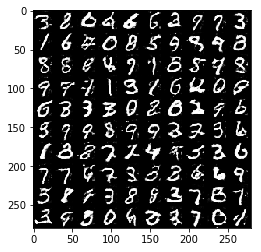

Epoch 5/5... Generator Loss: 1.9562 Discriminator Loss: 0.7659
Epoch 5/5... Generator Loss: 1.6830 Discriminator Loss: 0.6819
Epoch 5/5... Generator Loss: 2.0640 Discriminator Loss: 0.6482
Epoch 5/5... Generator Loss: 0.4106 Discriminator Loss: 1.6135
Epoch 5/5... Generator Loss: 2.3325 Discriminator Loss: 0.8227


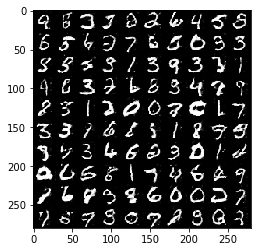

Epoch 5/5... Generator Loss: 0.9694 Discriminator Loss: 0.9062
Epoch 5/5... Generator Loss: 1.9131 Discriminator Loss: 0.7039


In [38]:
batch_size = 128
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/5... Generator Loss: 3.0504 Discriminator Loss: 0.5813
Epoch 1/5... Generator Loss: 2.0886 Discriminator Loss: 0.5878
Epoch 1/5... Generator Loss: 10.4138 Discriminator Loss: 1.1460
Epoch 1/5... Generator Loss: 2.0062 Discriminator Loss: 0.6417
Epoch 1/5... Generator Loss: 1.6454 Discriminator Loss: 0.7576


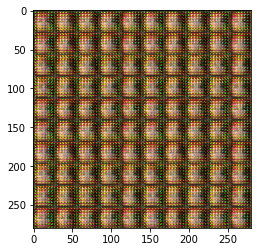

Epoch 1/5... Generator Loss: 3.5367 Discriminator Loss: 0.5072
Epoch 1/5... Generator Loss: 2.7031 Discriminator Loss: 0.4805
Epoch 1/5... Generator Loss: 3.6783 Discriminator Loss: 0.4513
Epoch 1/5... Generator Loss: 2.0085 Discriminator Loss: 0.5941
Epoch 1/5... Generator Loss: 1.2810 Discriminator Loss: 0.7978


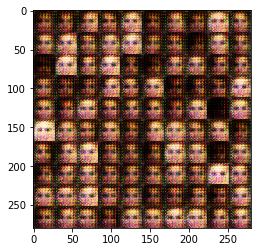

Epoch 1/5... Generator Loss: 2.6016 Discriminator Loss: 0.5091
Epoch 1/5... Generator Loss: 1.9726 Discriminator Loss: 0.6903
Epoch 1/5... Generator Loss: 1.3712 Discriminator Loss: 0.8597
Epoch 1/5... Generator Loss: 0.6895 Discriminator Loss: 1.2589
Epoch 1/5... Generator Loss: 1.9605 Discriminator Loss: 0.8719


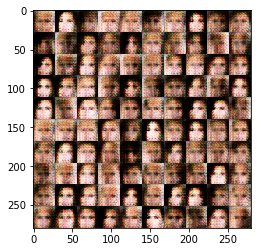

Epoch 1/5... Generator Loss: 2.2663 Discriminator Loss: 1.0504
Epoch 1/5... Generator Loss: 1.6929 Discriminator Loss: 0.8909
Epoch 1/5... Generator Loss: 1.2311 Discriminator Loss: 0.8843
Epoch 1/5... Generator Loss: 2.3907 Discriminator Loss: 0.9513
Epoch 1/5... Generator Loss: 0.4711 Discriminator Loss: 1.6067


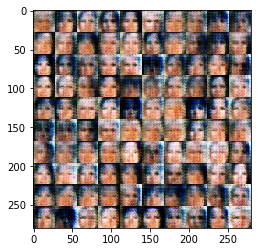

Epoch 1/5... Generator Loss: 1.4300 Discriminator Loss: 0.8969
Epoch 1/5... Generator Loss: 1.1484 Discriminator Loss: 1.0302
Epoch 1/5... Generator Loss: 1.3399 Discriminator Loss: 0.9111
Epoch 1/5... Generator Loss: 1.4597 Discriminator Loss: 0.8282
Epoch 1/5... Generator Loss: 0.9535 Discriminator Loss: 1.1512


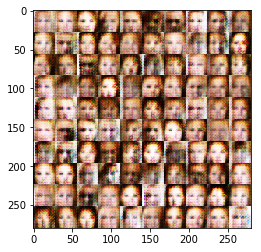

Epoch 1/5... Generator Loss: 0.8114 Discriminator Loss: 1.1239
Epoch 1/5... Generator Loss: 2.2447 Discriminator Loss: 0.8601
Epoch 1/5... Generator Loss: 1.1359 Discriminator Loss: 1.1174
Epoch 1/5... Generator Loss: 0.8434 Discriminator Loss: 1.2693
Epoch 1/5... Generator Loss: 0.7221 Discriminator Loss: 1.2875


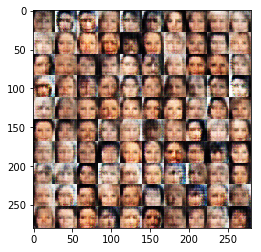

Epoch 1/5... Generator Loss: 1.5706 Discriminator Loss: 1.0289
Epoch 1/5... Generator Loss: 1.9380 Discriminator Loss: 1.2719
Epoch 1/5... Generator Loss: 0.8484 Discriminator Loss: 1.1327
Epoch 1/5... Generator Loss: 1.0402 Discriminator Loss: 1.1474
Epoch 1/5... Generator Loss: 0.6745 Discriminator Loss: 1.3345


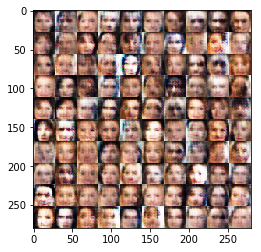

Epoch 1/5... Generator Loss: 0.9997 Discriminator Loss: 1.1400
Epoch 1/5... Generator Loss: 1.9196 Discriminator Loss: 1.0332
Epoch 1/5... Generator Loss: 1.6945 Discriminator Loss: 1.4229
Epoch 1/5... Generator Loss: 1.2430 Discriminator Loss: 1.0562
Epoch 1/5... Generator Loss: 1.4199 Discriminator Loss: 1.0976


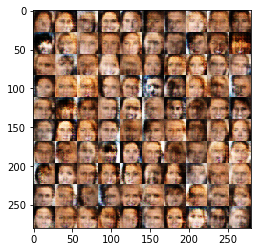

Epoch 1/5... Generator Loss: 1.0404 Discriminator Loss: 1.0385
Epoch 1/5... Generator Loss: 1.4378 Discriminator Loss: 1.1850
Epoch 1/5... Generator Loss: 1.4826 Discriminator Loss: 1.0512
Epoch 1/5... Generator Loss: 0.9661 Discriminator Loss: 1.1415
Epoch 1/5... Generator Loss: 0.8459 Discriminator Loss: 1.2685


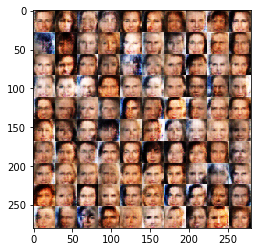

Epoch 1/5... Generator Loss: 1.6732 Discriminator Loss: 1.1278
Epoch 1/5... Generator Loss: 0.8595 Discriminator Loss: 1.1461
Epoch 1/5... Generator Loss: 1.4645 Discriminator Loss: 1.0045
Epoch 1/5... Generator Loss: 1.2391 Discriminator Loss: 1.1829
Epoch 1/5... Generator Loss: 1.1193 Discriminator Loss: 1.0904


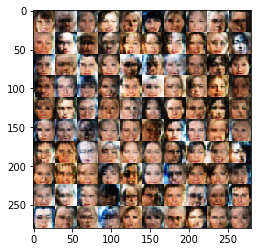

Epoch 1/5... Generator Loss: 1.6741 Discriminator Loss: 1.1815
Epoch 1/5... Generator Loss: 1.6177 Discriminator Loss: 1.1500
Epoch 1/5... Generator Loss: 0.8038 Discriminator Loss: 1.1820
Epoch 1/5... Generator Loss: 1.1293 Discriminator Loss: 1.2168
Epoch 1/5... Generator Loss: 1.2357 Discriminator Loss: 0.9624


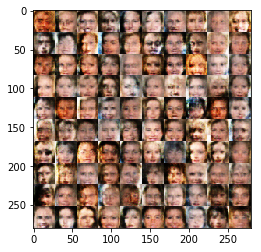

Epoch 1/5... Generator Loss: 1.0272 Discriminator Loss: 1.0676
Epoch 1/5... Generator Loss: 1.6206 Discriminator Loss: 1.0407
Epoch 1/5... Generator Loss: 1.3901 Discriminator Loss: 1.0304
Epoch 1/5... Generator Loss: 1.2494 Discriminator Loss: 0.9877
Epoch 1/5... Generator Loss: 1.1190 Discriminator Loss: 1.0021


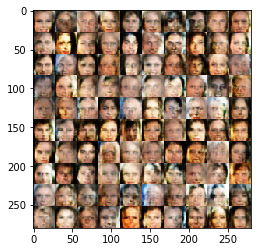

Epoch 1/5... Generator Loss: 1.5544 Discriminator Loss: 1.0217
Epoch 1/5... Generator Loss: 1.0536 Discriminator Loss: 1.1976
Epoch 1/5... Generator Loss: 1.0769 Discriminator Loss: 1.0763
Epoch 1/5... Generator Loss: 1.1216 Discriminator Loss: 1.0640
Epoch 1/5... Generator Loss: 1.1048 Discriminator Loss: 0.9716


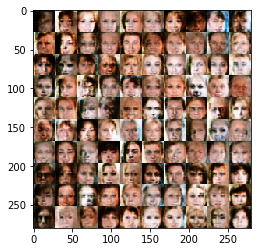

Epoch 1/5... Generator Loss: 1.0226 Discriminator Loss: 1.2787
Epoch 1/5... Generator Loss: 1.8471 Discriminator Loss: 0.9977
Epoch 1/5... Generator Loss: 2.0297 Discriminator Loss: 1.3027
Epoch 1/5... Generator Loss: 0.6163 Discriminator Loss: 1.3070
Epoch 1/5... Generator Loss: 1.2930 Discriminator Loss: 1.0930


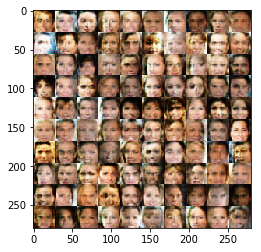

Epoch 1/5... Generator Loss: 1.3864 Discriminator Loss: 0.9915
Epoch 1/5... Generator Loss: 1.6239 Discriminator Loss: 1.0411
Epoch 1/5... Generator Loss: 1.0051 Discriminator Loss: 1.0415
Epoch 1/5... Generator Loss: 1.5669 Discriminator Loss: 0.8659
Epoch 1/5... Generator Loss: 1.4286 Discriminator Loss: 0.8532


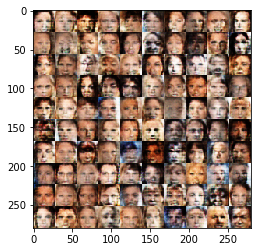

Epoch 1/5... Generator Loss: 1.0996 Discriminator Loss: 1.0348
Epoch 1/5... Generator Loss: 1.2552 Discriminator Loss: 1.1097
Epoch 1/5... Generator Loss: 0.7901 Discriminator Loss: 1.1199
Epoch 1/5... Generator Loss: 0.4878 Discriminator Loss: 1.4335
Epoch 2/5... Generator Loss: 0.8642 Discriminator Loss: 1.0652


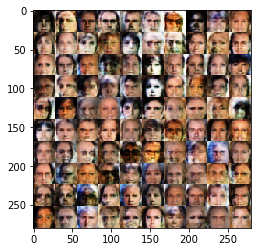

Epoch 2/5... Generator Loss: 0.8905 Discriminator Loss: 1.0566
Epoch 2/5... Generator Loss: 1.2695 Discriminator Loss: 1.1225
Epoch 2/5... Generator Loss: 0.9744 Discriminator Loss: 1.0326
Epoch 2/5... Generator Loss: 0.8787 Discriminator Loss: 1.3143
Epoch 2/5... Generator Loss: 1.3390 Discriminator Loss: 1.3414


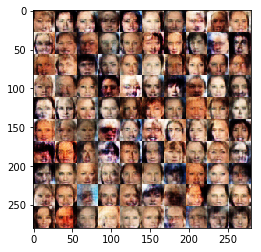

Epoch 2/5... Generator Loss: 1.2123 Discriminator Loss: 0.9811
Epoch 2/5... Generator Loss: 1.2250 Discriminator Loss: 1.2145
Epoch 2/5... Generator Loss: 1.0219 Discriminator Loss: 1.0440
Epoch 2/5... Generator Loss: 0.4605 Discriminator Loss: 1.5745
Epoch 2/5... Generator Loss: 1.8162 Discriminator Loss: 1.0230


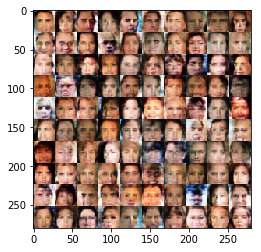

Epoch 2/5... Generator Loss: 1.1269 Discriminator Loss: 0.9726
Epoch 2/5... Generator Loss: 1.8491 Discriminator Loss: 0.9774
Epoch 2/5... Generator Loss: 1.4768 Discriminator Loss: 1.1527
Epoch 2/5... Generator Loss: 0.9282 Discriminator Loss: 1.1884
Epoch 2/5... Generator Loss: 1.0021 Discriminator Loss: 1.0419


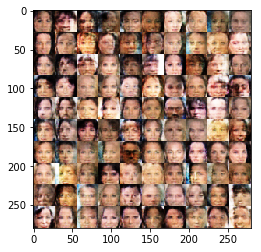

Epoch 2/5... Generator Loss: 1.7778 Discriminator Loss: 0.8891
Epoch 2/5... Generator Loss: 1.0298 Discriminator Loss: 1.0641
Epoch 2/5... Generator Loss: 1.4991 Discriminator Loss: 1.0225
Epoch 2/5... Generator Loss: 1.4176 Discriminator Loss: 1.0133
Epoch 2/5... Generator Loss: 1.6883 Discriminator Loss: 0.8123


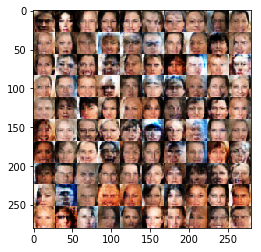

Epoch 2/5... Generator Loss: 0.7860 Discriminator Loss: 1.1022
Epoch 2/5... Generator Loss: 1.4024 Discriminator Loss: 0.9941
Epoch 2/5... Generator Loss: 0.8257 Discriminator Loss: 1.0905
Epoch 2/5... Generator Loss: 1.5730 Discriminator Loss: 1.2719
Epoch 2/5... Generator Loss: 1.8111 Discriminator Loss: 1.2647


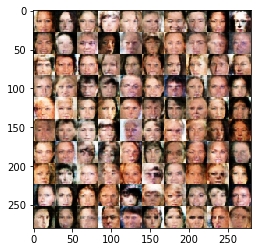

Epoch 2/5... Generator Loss: 0.7037 Discriminator Loss: 1.1455
Epoch 2/5... Generator Loss: 1.1418 Discriminator Loss: 0.9917
Epoch 2/5... Generator Loss: 1.0413 Discriminator Loss: 0.9110
Epoch 2/5... Generator Loss: 1.2980 Discriminator Loss: 0.9050
Epoch 2/5... Generator Loss: 1.1173 Discriminator Loss: 1.1403


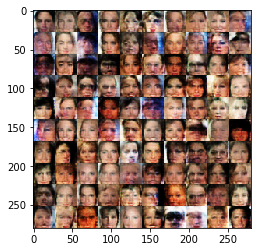

Epoch 2/5... Generator Loss: 1.4234 Discriminator Loss: 0.7816
Epoch 2/5... Generator Loss: 2.2565 Discriminator Loss: 1.1432
Epoch 2/5... Generator Loss: 1.5630 Discriminator Loss: 0.9307
Epoch 2/5... Generator Loss: 0.7710 Discriminator Loss: 1.1983
Epoch 2/5... Generator Loss: 1.4668 Discriminator Loss: 0.9489


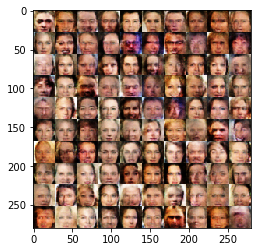

Epoch 2/5... Generator Loss: 1.6925 Discriminator Loss: 0.8921
Epoch 2/5... Generator Loss: 0.9385 Discriminator Loss: 1.1143
Epoch 2/5... Generator Loss: 0.6781 Discriminator Loss: 1.1922
Epoch 2/5... Generator Loss: 0.6214 Discriminator Loss: 1.2457
Epoch 2/5... Generator Loss: 1.1241 Discriminator Loss: 1.1968


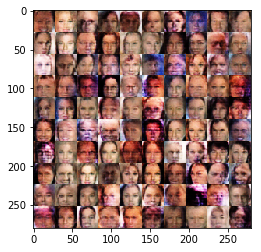

Epoch 2/5... Generator Loss: 1.0927 Discriminator Loss: 1.0895
Epoch 2/5... Generator Loss: 1.2146 Discriminator Loss: 1.0706
Epoch 2/5... Generator Loss: 1.2386 Discriminator Loss: 0.9941
Epoch 2/5... Generator Loss: 1.4763 Discriminator Loss: 1.1082
Epoch 2/5... Generator Loss: 1.7502 Discriminator Loss: 1.0123


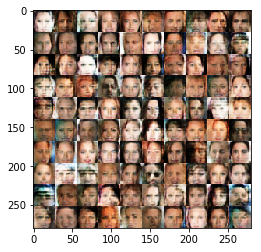

Epoch 2/5... Generator Loss: 1.2406 Discriminator Loss: 0.8143
Epoch 2/5... Generator Loss: 0.7760 Discriminator Loss: 1.1141
Epoch 2/5... Generator Loss: 0.4207 Discriminator Loss: 1.4969
Epoch 2/5... Generator Loss: 0.8542 Discriminator Loss: 1.0983
Epoch 2/5... Generator Loss: 0.8448 Discriminator Loss: 1.0897


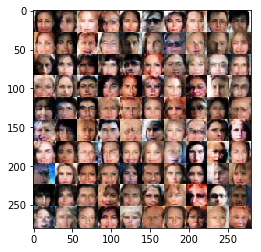

Epoch 2/5... Generator Loss: 1.0965 Discriminator Loss: 0.8429
Epoch 2/5... Generator Loss: 0.6165 Discriminator Loss: 1.2930
Epoch 2/5... Generator Loss: 0.8738 Discriminator Loss: 1.1621
Epoch 2/5... Generator Loss: 0.5482 Discriminator Loss: 1.3781
Epoch 2/5... Generator Loss: 1.5195 Discriminator Loss: 0.9630


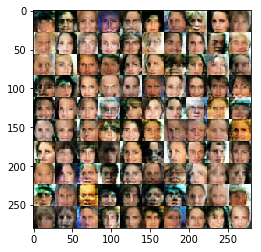

Epoch 2/5... Generator Loss: 0.8429 Discriminator Loss: 1.0278
Epoch 2/5... Generator Loss: 0.7296 Discriminator Loss: 1.2005
Epoch 2/5... Generator Loss: 1.4278 Discriminator Loss: 0.7511
Epoch 2/5... Generator Loss: 0.5745 Discriminator Loss: 1.4092
Epoch 2/5... Generator Loss: 0.7010 Discriminator Loss: 1.1754


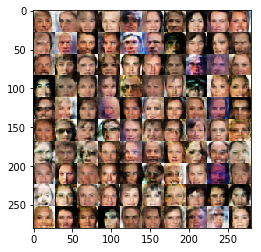

Epoch 2/5... Generator Loss: 1.3066 Discriminator Loss: 0.8292
Epoch 2/5... Generator Loss: 0.4964 Discriminator Loss: 1.5140
Epoch 2/5... Generator Loss: 1.9994 Discriminator Loss: 1.0164
Epoch 2/5... Generator Loss: 1.1838 Discriminator Loss: 0.9287
Epoch 2/5... Generator Loss: 1.1170 Discriminator Loss: 0.9029


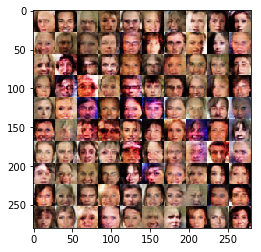

Epoch 2/5... Generator Loss: 0.5013 Discriminator Loss: 1.4430
Epoch 2/5... Generator Loss: 1.7630 Discriminator Loss: 0.7730
Epoch 2/5... Generator Loss: 0.7047 Discriminator Loss: 1.1977
Epoch 2/5... Generator Loss: 1.5111 Discriminator Loss: 0.8239
Epoch 2/5... Generator Loss: 0.7279 Discriminator Loss: 1.1442


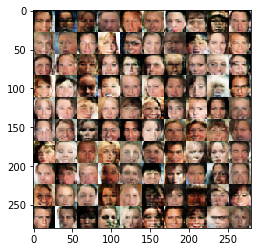

Epoch 2/5... Generator Loss: 2.1927 Discriminator Loss: 0.6112
Epoch 2/5... Generator Loss: 1.3121 Discriminator Loss: 0.7945
Epoch 2/5... Generator Loss: 1.0997 Discriminator Loss: 0.9085
Epoch 2/5... Generator Loss: 3.0897 Discriminator Loss: 1.0122
Epoch 2/5... Generator Loss: 0.8560 Discriminator Loss: 1.1588


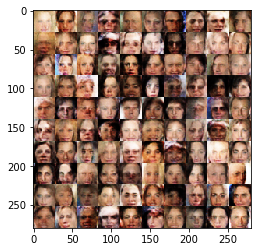

Epoch 2/5... Generator Loss: 1.4152 Discriminator Loss: 0.8791
Epoch 2/5... Generator Loss: 0.8838 Discriminator Loss: 1.0461
Epoch 2/5... Generator Loss: 0.4284 Discriminator Loss: 1.5740
Epoch 3/5... Generator Loss: 0.7252 Discriminator Loss: 1.2345
Epoch 3/5... Generator Loss: 1.3140 Discriminator Loss: 0.9612


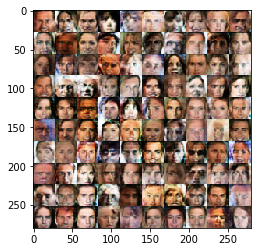

Epoch 3/5... Generator Loss: 0.7796 Discriminator Loss: 1.3161
Epoch 3/5... Generator Loss: 1.3665 Discriminator Loss: 0.9776
Epoch 3/5... Generator Loss: 0.8587 Discriminator Loss: 0.9857
Epoch 3/5... Generator Loss: 1.4255 Discriminator Loss: 0.9179
Epoch 3/5... Generator Loss: 1.6500 Discriminator Loss: 0.8922


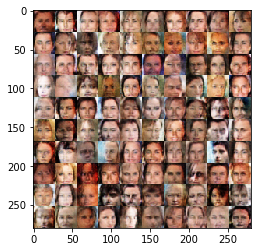

Epoch 3/5... Generator Loss: 0.3996 Discriminator Loss: 1.5688
Epoch 3/5... Generator Loss: 1.1424 Discriminator Loss: 0.8270
Epoch 3/5... Generator Loss: 0.6125 Discriminator Loss: 1.2681
Epoch 3/5... Generator Loss: 1.4948 Discriminator Loss: 0.9984
Epoch 3/5... Generator Loss: 2.0783 Discriminator Loss: 0.7706


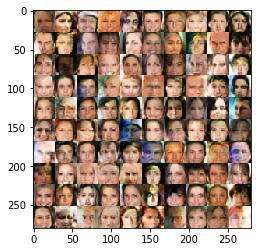

Epoch 3/5... Generator Loss: 1.4272 Discriminator Loss: 0.7903
Epoch 3/5... Generator Loss: 2.0185 Discriminator Loss: 0.8409
Epoch 3/5... Generator Loss: 0.6386 Discriminator Loss: 1.2890
Epoch 3/5... Generator Loss: 1.1116 Discriminator Loss: 0.9434
Epoch 3/5... Generator Loss: 0.5977 Discriminator Loss: 1.2422


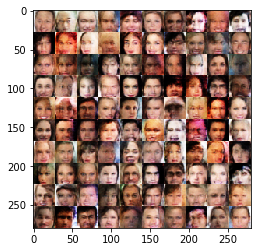

Epoch 3/5... Generator Loss: 1.9426 Discriminator Loss: 0.8267
Epoch 3/5... Generator Loss: 2.0031 Discriminator Loss: 1.9246
Epoch 3/5... Generator Loss: 1.2466 Discriminator Loss: 0.8864
Epoch 3/5... Generator Loss: 1.3312 Discriminator Loss: 0.7808
Epoch 3/5... Generator Loss: 0.7920 Discriminator Loss: 1.0460


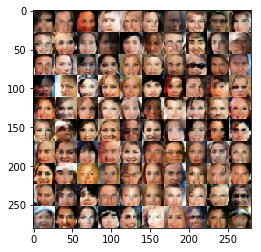

Epoch 3/5... Generator Loss: 2.4845 Discriminator Loss: 1.2103
Epoch 3/5... Generator Loss: 1.7807 Discriminator Loss: 0.7983
Epoch 3/5... Generator Loss: 0.9157 Discriminator Loss: 0.9806
Epoch 3/5... Generator Loss: 1.4232 Discriminator Loss: 0.8434
Epoch 3/5... Generator Loss: 1.7743 Discriminator Loss: 0.6948


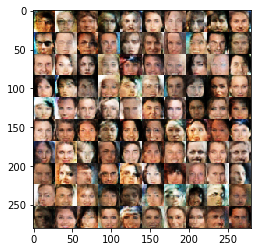

Epoch 3/5... Generator Loss: 0.8726 Discriminator Loss: 1.1703
Epoch 3/5... Generator Loss: 0.7456 Discriminator Loss: 1.1065
Epoch 3/5... Generator Loss: 0.8876 Discriminator Loss: 1.0255
Epoch 3/5... Generator Loss: 1.4438 Discriminator Loss: 0.9267
Epoch 3/5... Generator Loss: 1.6881 Discriminator Loss: 0.6736


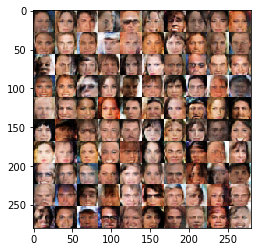

Epoch 3/5... Generator Loss: 1.6117 Discriminator Loss: 0.9507
Epoch 3/5... Generator Loss: 3.0338 Discriminator Loss: 1.0590
Epoch 3/5... Generator Loss: 0.9171 Discriminator Loss: 0.9917
Epoch 3/5... Generator Loss: 0.9830 Discriminator Loss: 0.9726
Epoch 3/5... Generator Loss: 1.1520 Discriminator Loss: 0.8685


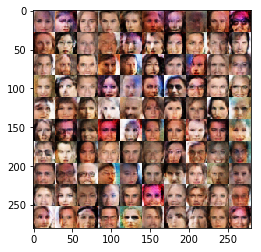

Epoch 3/5... Generator Loss: 1.2677 Discriminator Loss: 0.8773
Epoch 3/5... Generator Loss: 2.2652 Discriminator Loss: 0.7821
Epoch 3/5... Generator Loss: 0.8537 Discriminator Loss: 0.9946
Epoch 3/5... Generator Loss: 2.0595 Discriminator Loss: 0.9060
Epoch 3/5... Generator Loss: 1.5712 Discriminator Loss: 0.6951


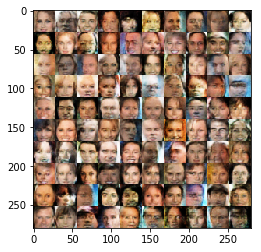

Epoch 3/5... Generator Loss: 0.8734 Discriminator Loss: 0.9973
Epoch 3/5... Generator Loss: 1.1315 Discriminator Loss: 0.7973
Epoch 3/5... Generator Loss: 0.6954 Discriminator Loss: 1.1695
Epoch 3/5... Generator Loss: 1.4675 Discriminator Loss: 0.8179
Epoch 3/5... Generator Loss: 1.3389 Discriminator Loss: 0.8313


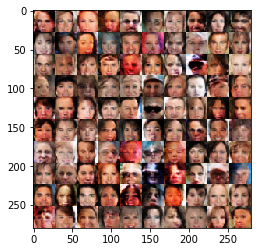

Epoch 3/5... Generator Loss: 2.3255 Discriminator Loss: 0.6802
Epoch 3/5... Generator Loss: 0.5946 Discriminator Loss: 1.2830
Epoch 3/5... Generator Loss: 1.9819 Discriminator Loss: 0.7759
Epoch 3/5... Generator Loss: 2.5435 Discriminator Loss: 0.9814
Epoch 3/5... Generator Loss: 1.4675 Discriminator Loss: 0.6856


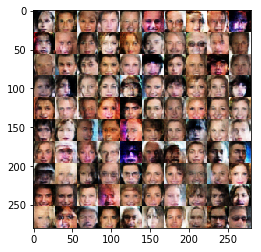

Epoch 3/5... Generator Loss: 0.6444 Discriminator Loss: 1.2056
Epoch 3/5... Generator Loss: 0.7108 Discriminator Loss: 1.2483
Epoch 3/5... Generator Loss: 0.6506 Discriminator Loss: 1.1652
Epoch 3/5... Generator Loss: 1.4247 Discriminator Loss: 0.7170
Epoch 3/5... Generator Loss: 1.9848 Discriminator Loss: 0.6730


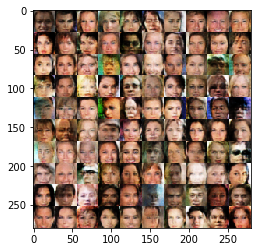

Epoch 3/5... Generator Loss: 1.2326 Discriminator Loss: 0.9172
Epoch 3/5... Generator Loss: 0.8437 Discriminator Loss: 1.0493
Epoch 3/5... Generator Loss: 2.2534 Discriminator Loss: 0.7463
Epoch 3/5... Generator Loss: 1.1664 Discriminator Loss: 0.8750
Epoch 3/5... Generator Loss: 0.4319 Discriminator Loss: 1.5428


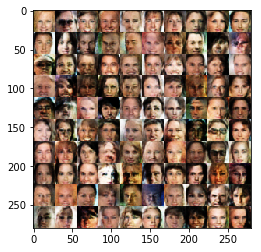

Epoch 3/5... Generator Loss: 1.0492 Discriminator Loss: 0.8702
Epoch 3/5... Generator Loss: 0.7588 Discriminator Loss: 1.1142
Epoch 3/5... Generator Loss: 0.5554 Discriminator Loss: 1.3135
Epoch 3/5... Generator Loss: 0.9721 Discriminator Loss: 0.9384
Epoch 3/5... Generator Loss: 1.5860 Discriminator Loss: 0.7798


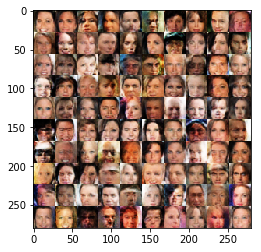

Epoch 3/5... Generator Loss: 1.3497 Discriminator Loss: 0.8091
Epoch 3/5... Generator Loss: 0.5567 Discriminator Loss: 1.3655
Epoch 3/5... Generator Loss: 2.6666 Discriminator Loss: 1.0390
Epoch 3/5... Generator Loss: 0.9007 Discriminator Loss: 1.0317
Epoch 3/5... Generator Loss: 1.4600 Discriminator Loss: 0.8229


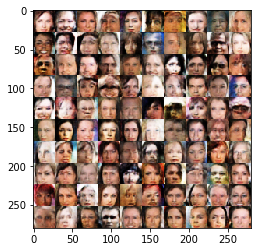

Epoch 3/5... Generator Loss: 1.6957 Discriminator Loss: 0.8053
Epoch 3/5... Generator Loss: 1.2204 Discriminator Loss: 0.8457
Epoch 3/5... Generator Loss: 1.1202 Discriminator Loss: 0.8890
Epoch 3/5... Generator Loss: 0.7478 Discriminator Loss: 1.2312
Epoch 3/5... Generator Loss: 1.2703 Discriminator Loss: 0.8039


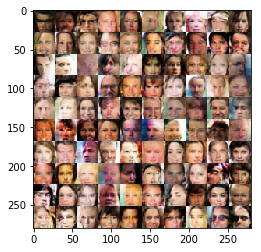

Epoch 3/5... Generator Loss: 2.3258 Discriminator Loss: 0.9129
Epoch 3/5... Generator Loss: 1.2333 Discriminator Loss: 0.7819
Epoch 4/5... Generator Loss: 1.5161 Discriminator Loss: 0.6605
Epoch 4/5... Generator Loss: 1.0642 Discriminator Loss: 0.8484
Epoch 4/5... Generator Loss: 1.1933 Discriminator Loss: 0.7997


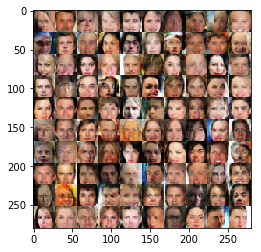

Epoch 4/5... Generator Loss: 1.1535 Discriminator Loss: 0.9036
Epoch 4/5... Generator Loss: 3.5848 Discriminator Loss: 0.5628
Epoch 4/5... Generator Loss: 2.1117 Discriminator Loss: 0.6353
Epoch 4/5... Generator Loss: 0.3786 Discriminator Loss: 1.7134
Epoch 4/5... Generator Loss: 0.9534 Discriminator Loss: 0.9624


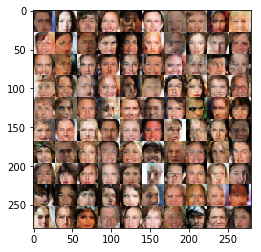

Epoch 4/5... Generator Loss: 1.4805 Discriminator Loss: 0.7558
Epoch 4/5... Generator Loss: 2.2300 Discriminator Loss: 0.7224
Epoch 4/5... Generator Loss: 1.3954 Discriminator Loss: 0.7121
Epoch 4/5... Generator Loss: 0.9748 Discriminator Loss: 0.9826
Epoch 4/5... Generator Loss: 0.7936 Discriminator Loss: 1.0679


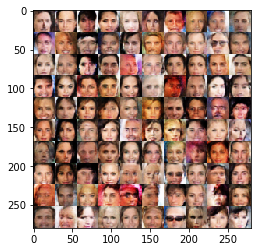

Epoch 4/5... Generator Loss: 0.8910 Discriminator Loss: 1.0161
Epoch 4/5... Generator Loss: 0.7351 Discriminator Loss: 1.0833
Epoch 4/5... Generator Loss: 1.2316 Discriminator Loss: 0.7884
Epoch 4/5... Generator Loss: 0.4684 Discriminator Loss: 1.5022
Epoch 4/5... Generator Loss: 0.3439 Discriminator Loss: 1.7284


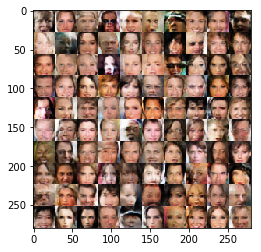

Epoch 4/5... Generator Loss: 2.3603 Discriminator Loss: 0.5459
Epoch 4/5... Generator Loss: 1.5165 Discriminator Loss: 0.6870
Epoch 4/5... Generator Loss: 1.0311 Discriminator Loss: 0.9217
Epoch 4/5... Generator Loss: 2.3225 Discriminator Loss: 0.6444
Epoch 4/5... Generator Loss: 1.2143 Discriminator Loss: 0.8235


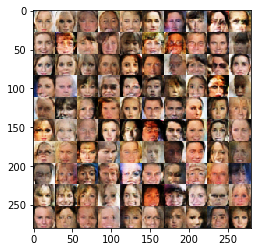

Epoch 4/5... Generator Loss: 2.4246 Discriminator Loss: 0.6012
Epoch 4/5... Generator Loss: 1.6636 Discriminator Loss: 0.6114
Epoch 4/5... Generator Loss: 1.0685 Discriminator Loss: 0.9012
Epoch 4/5... Generator Loss: 1.3471 Discriminator Loss: 0.7837
Epoch 4/5... Generator Loss: 0.7958 Discriminator Loss: 1.0555


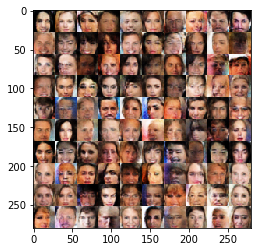

Epoch 4/5... Generator Loss: 2.0898 Discriminator Loss: 0.5788
Epoch 4/5... Generator Loss: 1.0972 Discriminator Loss: 0.8391
Epoch 4/5... Generator Loss: 2.6389 Discriminator Loss: 0.4679
Epoch 4/5... Generator Loss: 1.5207 Discriminator Loss: 0.7068
Epoch 4/5... Generator Loss: 0.9564 Discriminator Loss: 0.9088


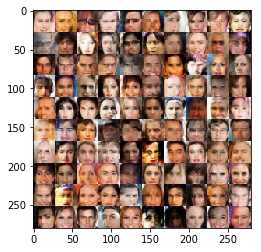

Epoch 4/5... Generator Loss: 2.7409 Discriminator Loss: 0.5005
Epoch 4/5... Generator Loss: 0.4781 Discriminator Loss: 1.4368
Epoch 4/5... Generator Loss: 2.6597 Discriminator Loss: 0.4994
Epoch 4/5... Generator Loss: 1.9938 Discriminator Loss: 0.6745
Epoch 4/5... Generator Loss: 1.2120 Discriminator Loss: 0.8223


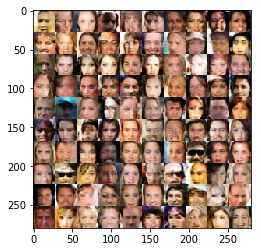

Epoch 4/5... Generator Loss: 1.8689 Discriminator Loss: 0.6145
Epoch 4/5... Generator Loss: 1.6827 Discriminator Loss: 0.6294
Epoch 4/5... Generator Loss: 2.3613 Discriminator Loss: 0.6293
Epoch 4/5... Generator Loss: 1.3800 Discriminator Loss: 0.7388
Epoch 4/5... Generator Loss: 0.9945 Discriminator Loss: 0.9060


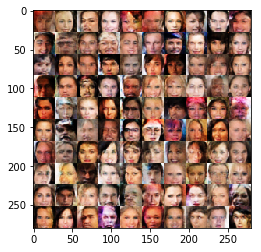

Epoch 4/5... Generator Loss: 0.8319 Discriminator Loss: 1.0726
Epoch 4/5... Generator Loss: 1.9996 Discriminator Loss: 0.7048
Epoch 4/5... Generator Loss: 1.1642 Discriminator Loss: 0.8187
Epoch 4/5... Generator Loss: 1.5894 Discriminator Loss: 0.6403
Epoch 4/5... Generator Loss: 3.2512 Discriminator Loss: 0.7814


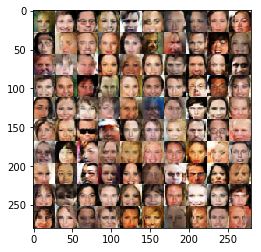

Epoch 4/5... Generator Loss: 2.7004 Discriminator Loss: 0.7881
Epoch 4/5... Generator Loss: 1.6351 Discriminator Loss: 0.6782
Epoch 4/5... Generator Loss: 2.8990 Discriminator Loss: 0.5050
Epoch 4/5... Generator Loss: 1.1283 Discriminator Loss: 0.8035
Epoch 4/5... Generator Loss: 2.7059 Discriminator Loss: 0.5977


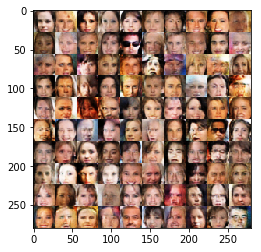

Epoch 4/5... Generator Loss: 1.8748 Discriminator Loss: 1.0246
Epoch 4/5... Generator Loss: 1.8117 Discriminator Loss: 0.5749
Epoch 4/5... Generator Loss: 2.3676 Discriminator Loss: 0.4835
Epoch 4/5... Generator Loss: 0.5574 Discriminator Loss: 1.5478
Epoch 4/5... Generator Loss: 0.7514 Discriminator Loss: 1.2542


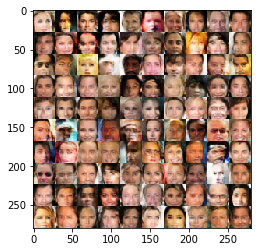

Epoch 4/5... Generator Loss: 1.6992 Discriminator Loss: 0.7135
Epoch 4/5... Generator Loss: 1.6615 Discriminator Loss: 0.9291
Epoch 4/5... Generator Loss: 0.9118 Discriminator Loss: 0.9846
Epoch 4/5... Generator Loss: 2.8909 Discriminator Loss: 0.5804
Epoch 4/5... Generator Loss: 1.5729 Discriminator Loss: 0.6328


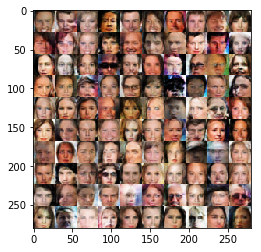

Epoch 4/5... Generator Loss: 1.4796 Discriminator Loss: 0.6832
Epoch 4/5... Generator Loss: 2.3366 Discriminator Loss: 0.6223
Epoch 4/5... Generator Loss: 1.6783 Discriminator Loss: 1.0211
Epoch 4/5... Generator Loss: 1.7049 Discriminator Loss: 0.7154
Epoch 4/5... Generator Loss: 1.4268 Discriminator Loss: 0.7120


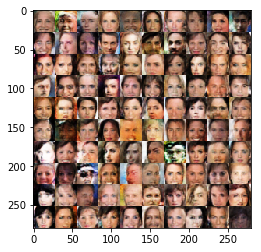

Epoch 4/5... Generator Loss: 1.9983 Discriminator Loss: 0.5476
Epoch 4/5... Generator Loss: 2.4246 Discriminator Loss: 0.6232
Epoch 4/5... Generator Loss: 1.8879 Discriminator Loss: 0.6295
Epoch 4/5... Generator Loss: 2.1032 Discriminator Loss: 0.5186
Epoch 4/5... Generator Loss: 1.8083 Discriminator Loss: 0.7710


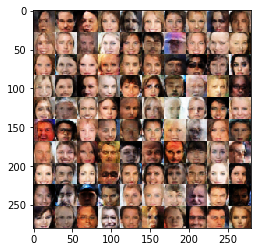

Epoch 4/5... Generator Loss: 1.5674 Discriminator Loss: 0.7621
Epoch 4/5... Generator Loss: 1.4343 Discriminator Loss: 0.7098
Epoch 4/5... Generator Loss: 2.2668 Discriminator Loss: 1.1019
Epoch 4/5... Generator Loss: 1.0633 Discriminator Loss: 0.8542
Epoch 4/5... Generator Loss: 1.1746 Discriminator Loss: 0.8291


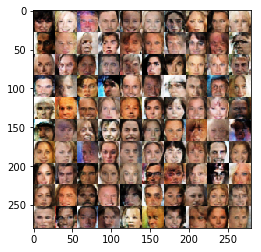

Epoch 4/5... Generator Loss: 2.9563 Discriminator Loss: 0.4901
Epoch 5/5... Generator Loss: 1.8435 Discriminator Loss: 0.5870
Epoch 5/5... Generator Loss: 1.2161 Discriminator Loss: 0.7579
Epoch 5/5... Generator Loss: 3.4676 Discriminator Loss: 0.4398
Epoch 5/5... Generator Loss: 3.0667 Discriminator Loss: 0.7797


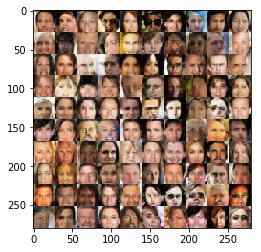

Epoch 5/5... Generator Loss: 2.3424 Discriminator Loss: 0.5119
Epoch 5/5... Generator Loss: 2.6414 Discriminator Loss: 0.6668
Epoch 5/5... Generator Loss: 2.2848 Discriminator Loss: 0.4975
Epoch 5/5... Generator Loss: 3.3208 Discriminator Loss: 0.6954
Epoch 5/5... Generator Loss: 1.3235 Discriminator Loss: 0.7285


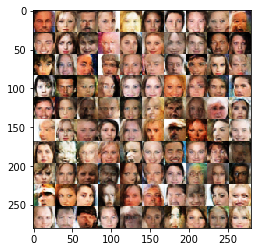

Epoch 5/5... Generator Loss: 2.1200 Discriminator Loss: 0.5366
Epoch 5/5... Generator Loss: 2.5912 Discriminator Loss: 0.5042
Epoch 5/5... Generator Loss: 1.1608 Discriminator Loss: 0.7944
Epoch 5/5... Generator Loss: 2.5363 Discriminator Loss: 0.4846
Epoch 5/5... Generator Loss: 2.4279 Discriminator Loss: 0.5485


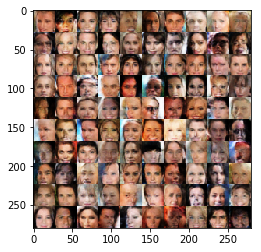

Epoch 5/5... Generator Loss: 2.2816 Discriminator Loss: 0.5266
Epoch 5/5... Generator Loss: 0.4092 Discriminator Loss: 1.6885
Epoch 5/5... Generator Loss: 1.5564 Discriminator Loss: 0.6847
Epoch 5/5... Generator Loss: 2.0298 Discriminator Loss: 0.5551
Epoch 5/5... Generator Loss: 1.8322 Discriminator Loss: 0.7544


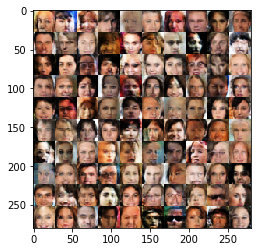

Epoch 5/5... Generator Loss: 1.0525 Discriminator Loss: 1.4224
Epoch 5/5... Generator Loss: 2.1611 Discriminator Loss: 0.7224
Epoch 5/5... Generator Loss: 0.7692 Discriminator Loss: 1.0802
Epoch 5/5... Generator Loss: 1.4351 Discriminator Loss: 0.7653
Epoch 5/5... Generator Loss: 1.2534 Discriminator Loss: 0.7721


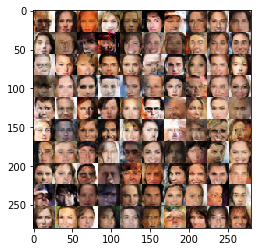

Epoch 5/5... Generator Loss: 1.1508 Discriminator Loss: 0.7873
Epoch 5/5... Generator Loss: 2.8235 Discriminator Loss: 0.4358
Epoch 5/5... Generator Loss: 3.3316 Discriminator Loss: 0.8003
Epoch 5/5... Generator Loss: 1.7729 Discriminator Loss: 0.6222
Epoch 5/5... Generator Loss: 1.6439 Discriminator Loss: 0.6349


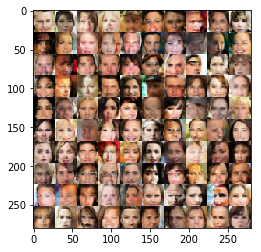

Epoch 5/5... Generator Loss: 2.8200 Discriminator Loss: 0.4390
Epoch 5/5... Generator Loss: 3.5057 Discriminator Loss: 0.5017
Epoch 5/5... Generator Loss: 2.3417 Discriminator Loss: 0.5891
Epoch 5/5... Generator Loss: 3.4967 Discriminator Loss: 0.4787
Epoch 5/5... Generator Loss: 4.2888 Discriminator Loss: 0.4230


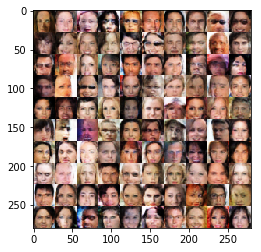

Epoch 5/5... Generator Loss: 1.5062 Discriminator Loss: 0.6758
Epoch 5/5... Generator Loss: 3.1668 Discriminator Loss: 0.4100
Epoch 5/5... Generator Loss: 1.9101 Discriminator Loss: 0.5667
Epoch 5/5... Generator Loss: 1.8230 Discriminator Loss: 0.8883
Epoch 5/5... Generator Loss: 1.7063 Discriminator Loss: 0.6042


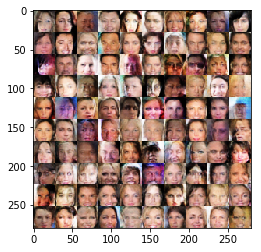

Epoch 5/5... Generator Loss: 2.1986 Discriminator Loss: 0.6487
Epoch 5/5... Generator Loss: 2.5371 Discriminator Loss: 0.5784
Epoch 5/5... Generator Loss: 0.9995 Discriminator Loss: 0.9400
Epoch 5/5... Generator Loss: 0.2424 Discriminator Loss: 2.3189
Epoch 5/5... Generator Loss: 1.6444 Discriminator Loss: 0.6374


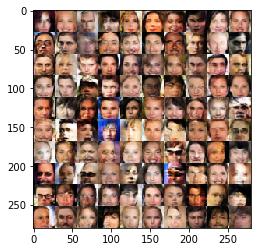

Epoch 5/5... Generator Loss: 2.1528 Discriminator Loss: 0.7921
Epoch 5/5... Generator Loss: 2.8788 Discriminator Loss: 0.5669
Epoch 5/5... Generator Loss: 2.1096 Discriminator Loss: 0.5393
Epoch 5/5... Generator Loss: 1.3408 Discriminator Loss: 0.6913
Epoch 5/5... Generator Loss: 2.7239 Discriminator Loss: 1.6844


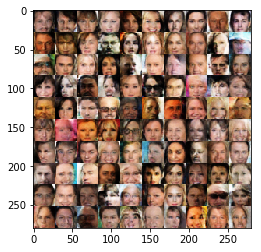

Epoch 5/5... Generator Loss: 2.2524 Discriminator Loss: 0.5696
Epoch 5/5... Generator Loss: 2.6279 Discriminator Loss: 0.5186
Epoch 5/5... Generator Loss: 1.9511 Discriminator Loss: 0.5477
Epoch 5/5... Generator Loss: 2.2985 Discriminator Loss: 0.5770
Epoch 5/5... Generator Loss: 1.4232 Discriminator Loss: 0.7032


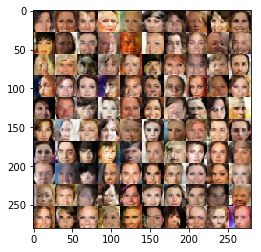

Epoch 5/5... Generator Loss: 3.1130 Discriminator Loss: 0.4413
Epoch 5/5... Generator Loss: 1.2665 Discriminator Loss: 0.8216
Epoch 5/5... Generator Loss: 1.0341 Discriminator Loss: 0.8743
Epoch 5/5... Generator Loss: 2.7069 Discriminator Loss: 0.4428
Epoch 5/5... Generator Loss: 2.1533 Discriminator Loss: 0.5643


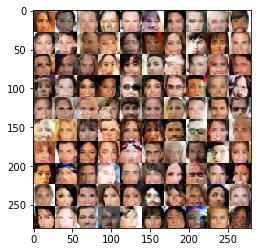

Epoch 5/5... Generator Loss: 1.7026 Discriminator Loss: 0.5940
Epoch 5/5... Generator Loss: 2.7018 Discriminator Loss: 0.4388
Epoch 5/5... Generator Loss: 2.6153 Discriminator Loss: 1.4269
Epoch 5/5... Generator Loss: 2.6211 Discriminator Loss: 0.7043
Epoch 5/5... Generator Loss: 1.9858 Discriminator Loss: 0.5380


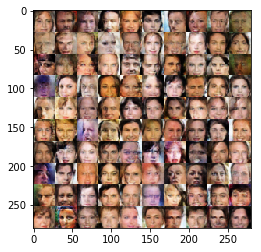

Epoch 5/5... Generator Loss: 0.8609 Discriminator Loss: 1.0018
Epoch 5/5... Generator Loss: 3.2985 Discriminator Loss: 0.6497
Epoch 5/5... Generator Loss: 1.4812 Discriminator Loss: 0.6676
Epoch 5/5... Generator Loss: 2.2099 Discriminator Loss: 0.5055
Epoch 5/5... Generator Loss: 2.9739 Discriminator Loss: 0.4393


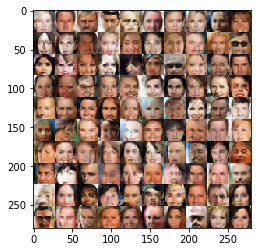

Epoch 5/5... Generator Loss: 2.1974 Discriminator Loss: 0.5742
Epoch 5/5... Generator Loss: 1.2524 Discriminator Loss: 0.7406
Epoch 5/5... Generator Loss: 7.2575 Discriminator Loss: 5.0112
Epoch 5/5... Generator Loss: 0.7329 Discriminator Loss: 1.1444
Epoch 5/5... Generator Loss: 2.2786 Discriminator Loss: 0.5093


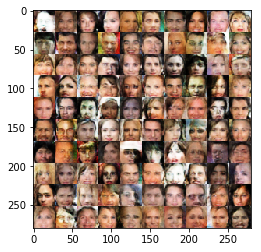

Epoch 5/5... Generator Loss: 1.5805 Discriminator Loss: 0.6496
Epoch 5/5... Generator Loss: 1.9926 Discriminator Loss: 0.5417
Epoch 5/5... Generator Loss: 1.8767 Discriminator Loss: 0.5626
Epoch 5/5... Generator Loss: 2.2392 Discriminator Loss: 0.5866
Epoch 5/5... Generator Loss: 1.9197 Discriminator Loss: 0.5389


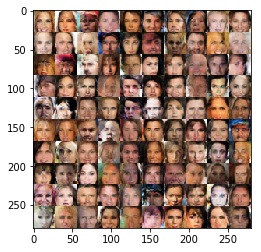

In [39]:
batch_size = 128
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.